In [1]:
%load_ext autoreload
%autoreload 2

In [1]:
# Numpy imports:
import numpy as np

#Scipy imports
import scipy
from scipy import optimize
from scipy.optimize import curve_fit

# for extracting filenames
import glob

# skimage submodules we need
import skimage.io
import skimage.measure
import skimage.filters
import skimage.exposure
import skimage.morphology
from skimage.registration import phase_cross_correlation

#Matplotlib imports
import matplotlib.pyplot as plt
%matplotlib inline
%config InlineBackend.figure_formats = {'png', 'retina'}
from matplotlib.colors import Normalize
import matplotlib.cm as cm
import matplotlib.colors as mcolors

# # Seaborn imports (stylistic for nice plots)
# import seaborn as sns
# rc={'lines.linewidth': 2, 'axes.labelsize': 14, 'axes.titlesize': 14, \
#     'xtick.labelsize' : 14, 'ytick.labelsize' : 14}
# sns.set(style='ticks', rc=rc)

#for DataFrames
import pandas as pd

#To interact with the operating system
import os

#For status bar 
from tqdm.notebook import tqdm as tqdm

In [2]:
import atp_cal

In [3]:
atp_cal.pboc_style_mpl()

# show images in viridis by default (pboc is fire?)
plt.rcParams['image.cmap'] = 'viridis'

## Import Images

In [4]:
#This should not change between experiments:
datapath = '../../data/atp_cal'

#This varies between experiments. 
datafolder = '2023-12-16_A81D_Cal' #EDIT THIS EVERY TIME

# bound Images
included_bound = '*uM*/*Pos*/*405*.tif' #EDIT THIS EVERY TIME
bound_files = np.sort(glob.glob(datapath+'/'+datafolder+'/'+included_bound))

# unbound Images
included_unbound = '*uM*/*Pos*/*480*.tif' #EDIT THIS EVERY TIME
unbound_files = np.sort(glob.glob(datapath+'/'+datafolder+'/'+included_unbound))

ATPconc=[]
for i, file in enumerate(unbound_files):
    conc = int(file.split('/')[5].split('_')[0].split('uM')[0]) #EDIT THIS EVERY TIME
    ATPconc.append(conc)
ATPconc = np.array(ATPconc)

#Read in images and save as array:
bound_array = atp_cal.file_to_image(bound_files)
unbound_array = atp_cal.file_to_image(unbound_files)

# Set background - want a no ATeam image for this
bound_bg = 1915
unbound_bg = 1915


# Define the zero concentration image (DO EVERY TIME):
bound_zero = np.average(bound_array[np.where(ATPconc==0)], axis=0)
unbound_zero = np.average(unbound_array[np.where(ATPconc==0)], axis=0)

## Subtract background

In [5]:
#Subtract im_dark from all calibration images
bound_bs = bound_array - bound_bg
unbound_bs = unbound_array - unbound_bg

In [6]:
unbound_bs[unbound_bs<0] = 0
bound_bs[unbound_bs<0] = 0

## Correct for uneven illumination background subtraction

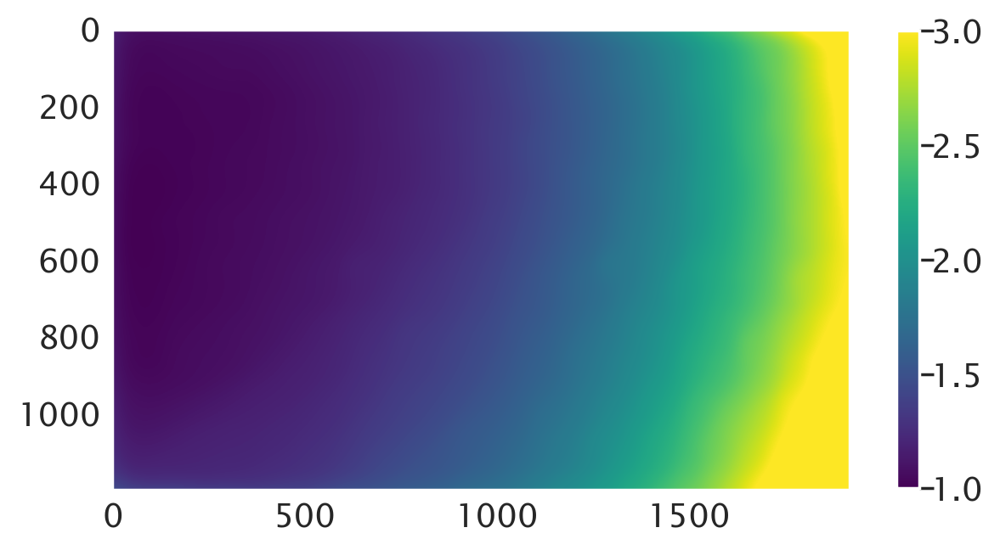

In [7]:
#Find the normilization matrix
bound_norm_mat = atp_cal.norm_mat_fn_iATP(bound_zero, bound_bg)
unbound_norm_mat = atp_cal.norm_mat_fn_iATP(unbound_zero, unbound_bg)

#plot the normalizaiton matrix
plt.imshow(unbound_norm_mat, vmin = 1, vmax = 3)
plt.colorbar(shrink = 0.7)
plt.grid(False)

In [8]:
#Normalize all the claibration images by multiplying by the normalization matrix
bound_norm = bound_bs*bound_norm_mat
unbound_norm = unbound_bs*unbound_norm_mat

## Calculate the average intensity value per concentration

### Is the ratio of averages the same as the average of ratios?

Ratio of averages:

In [9]:
#Average over the non-zero values in the image to get the calibration
bound_calavg = np.average(bound_norm, axis=(1,2))
unbound_calavg = np.average(unbound_norm, axis=(1,2))
ratio_calavg = bound_calavg/unbound_calavg 

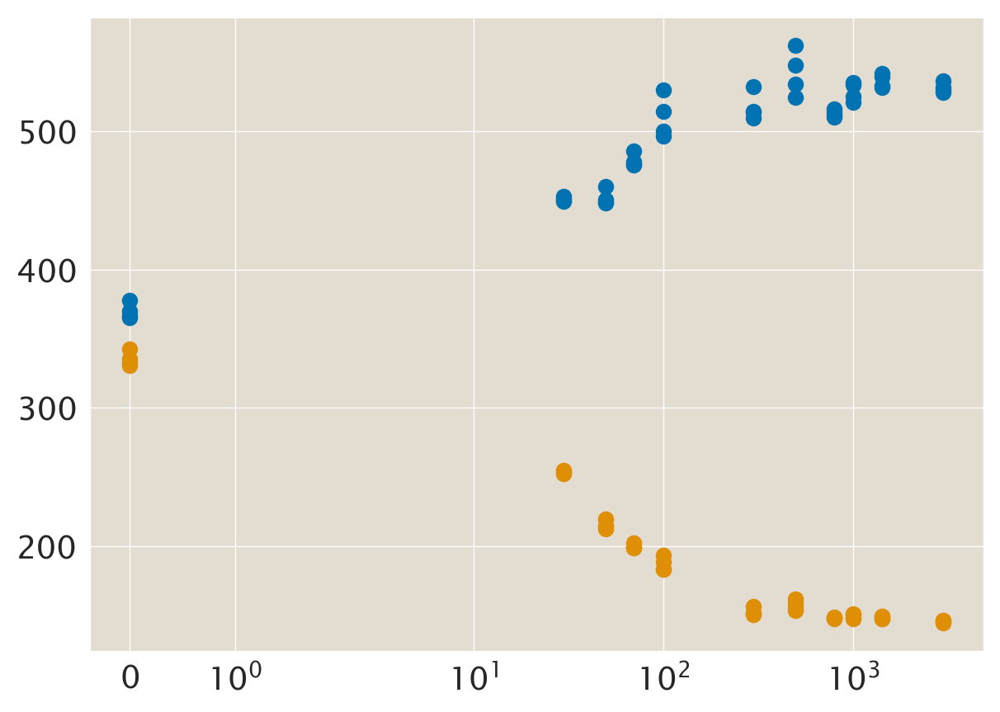

In [10]:
plt.scatter(ATPconc, bound_calavg)
plt.scatter(ATPconc, unbound_calavg)
plt.xscale('symlog')
plt.tick_params(which='minor', length=100, color='k')

Average of Ratios:

In [11]:
ratio_im = bound_norm/unbound_norm
ratio_im[np.where(ratio_im==np.inf)] = np.nan
ratio_calavg2 = np.nanmean(ratio_im, axis=(1,2))

/var/folders/8p/dg75nl0d7ml8f_vqy6lvm3740000gn/T/ipykernel_67919/1064643658.py:1: RuntimeWarning: divide by zero encountered in true_divide
  ratio_im = bound_norm/unbound_norm


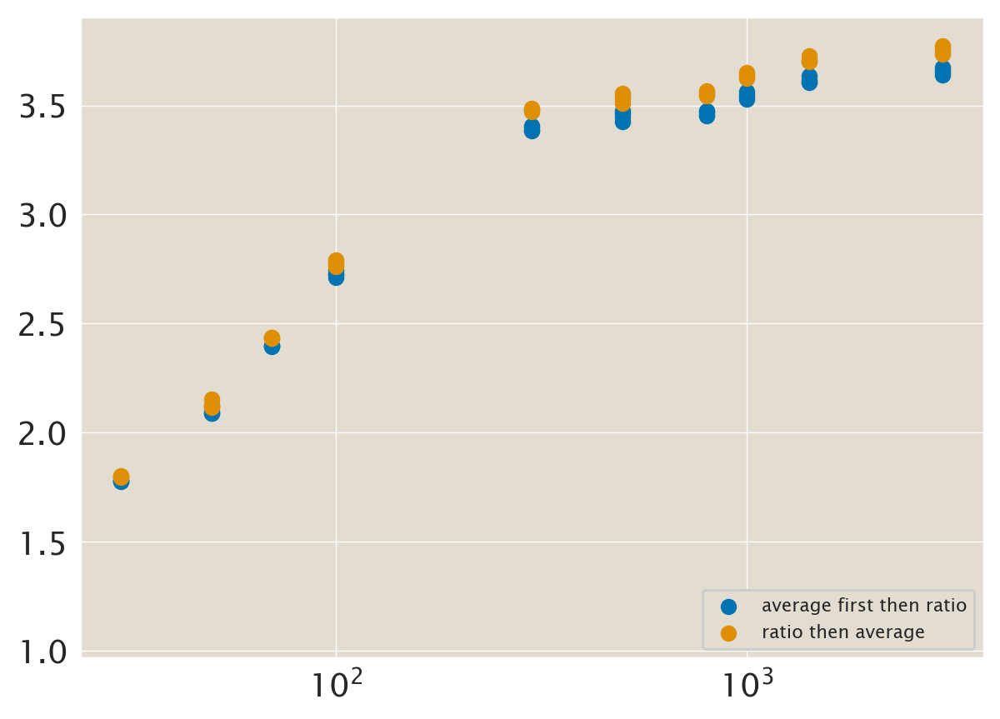

In [12]:
plt.scatter(ATPconc, ratio_calavg, label='average first then ratio')
plt.scatter(ATPconc, ratio_calavg2, label='ratio then average')
plt.legend(loc='lower right')
plt.xscale('log')

In [13]:
def ecdf(arr):
    ecdf_data = np.sort(np.ndarray.flatten(arr))
    ecdf_res = np.arange(len(ecdf_data))/len(ecdf_data)
    return ecdf_data, ecdf_res

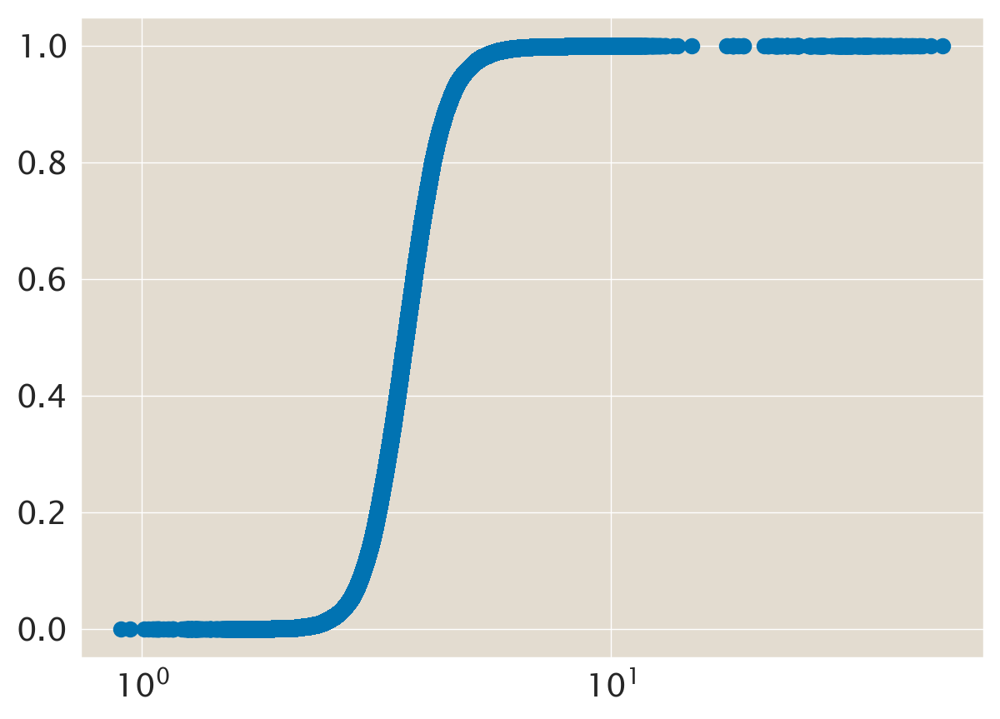

In [14]:
ratios_ecdf = ecdf(ratio_im[np.where(ATPconc==1420)])
plt.scatter(ratios_ecdf[0], ratios_ecdf[1])
plt.xscale('log')

## Find the trends of the data mean and standard deviation

Take the mean and standard deviations of each image

In [15]:
bound_mean = np.nanmean(bound_norm, axis=(1,2))
unbound_mean = np.nanmean(unbound_norm, axis=(1,2))
ratio_mean = np.nanmean(ratio_im, axis=(1,2))

bound_std = np.nanstd(bound_norm, axis=(1,2))
unbound_std = np.nanstd(unbound_norm, axis=(1,2))
ratio_std = np.nanstd(ratio_im, axis=(1,2))

The mean is linear with the standard deviation as plotted below!

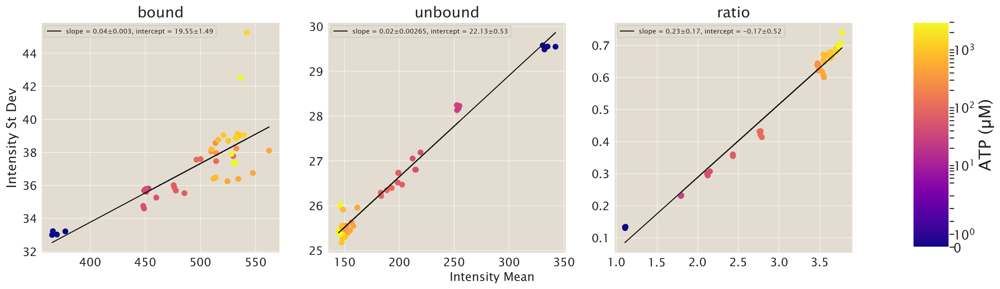

In [16]:
#colorbar settings
normalize = mcolors.SymLogNorm(linthresh=5, vmin=ATPconc.min(), vmax=ATPconc.max())
colormap = cm.plasma
scalarmappable = cm.ScalarMappable(norm=normalize, cmap=colormap)
scalarmappable.set_array(ATPconc)

#create figure
fig, ax = plt.subplots(1,3, figsize=(20,5))
ax[0].scatter(bound_mean, bound_std, color=colormap(normalize(ATPconc)))
ax[1].scatter(unbound_mean, unbound_std, color=colormap(normalize(ATPconc)))
ax[2].scatter(ratio_mean, ratio_std, color=colormap(normalize(ATPconc)))

#fit bound
coefficients, cov= np.polyfit(bound_mean, bound_std, deg=1, cov='unscaled')
conf_int = np.sqrt(np.diag(cov))
# Create a polynomial function using the coefficients
poly_function = np.poly1d(coefficients)
# Generate y values for the fitted line
y_fit = poly_function(bound_mean)
#plot
ax[0].plot(bound_mean, y_fit, color='k', label=f'slope = {round(coefficients[0],2)}±{round(conf_int[0],5)}, intercept = {round(coefficients[1],2)}±{round(conf_int[1],2)}')

#fit unbound
coefficients, cov = np.polyfit(unbound_mean, unbound_std, deg=1, cov='unscaled')
conf_int = np.sqrt(np.diag(cov))
# Create a polynomial function using the coefficients
poly_function = np.poly1d(coefficients)
# Generate y values for the fitted line
y_fit = poly_function(unbound_mean)
#plot
ax[1].plot(unbound_mean, y_fit, color='k', label=f'slope = {round(coefficients[0],2)}±{round(conf_int[0],5)}, intercept = {round(coefficients[1],2)}±{round(conf_int[1],2)}')

#fit ratio
coefficients, cov = np.polyfit(ratio_mean, ratio_std, deg=1, cov='unscaled')
conf_int = np.sqrt(np.diag(cov))
# Create a polynomial function using the coefficients
poly_function = np.poly1d(coefficients)
# Generate y values for the fitted line
y_fit = poly_function(ratio_mean)
#plot
ax[2].plot(ratio_mean, y_fit, color='k', label=f'slope = {round(coefficients[0],2)}±{round(conf_int[0],2)}, intercept = {round(coefficients[1],2)}±{round(conf_int[1],2)}')

#add colorbar
fig.subplots_adjust(right=0.8)
color_bar_ax = fig.add_axes([0.85, 0.13, 0.03, 0.75])
cbar = fig.colorbar(scalarmappable, cax=color_bar_ax)
cbar.ax.tick_params(labelsize=15)
cbar.set_label(label="ATP (µM)", size=20, weight='bold')

#set titles
ax[0].set_title('bound')
ax[1].set_title('unbound')
ax[2].set_title('ratio')

#set axis labels
fig.supxlabel('Intensity Mean')
ax[0].set_ylabel('Intensity St Dev')

#include legend
ax[0].legend()
ax[1].legend()
ax[2].legend()

# Histograms for each channel

The histograms for each channel show that as the mean increases so does the standard deviation. These plots are for processed images through the uneven illumination correction

## Bound Channel

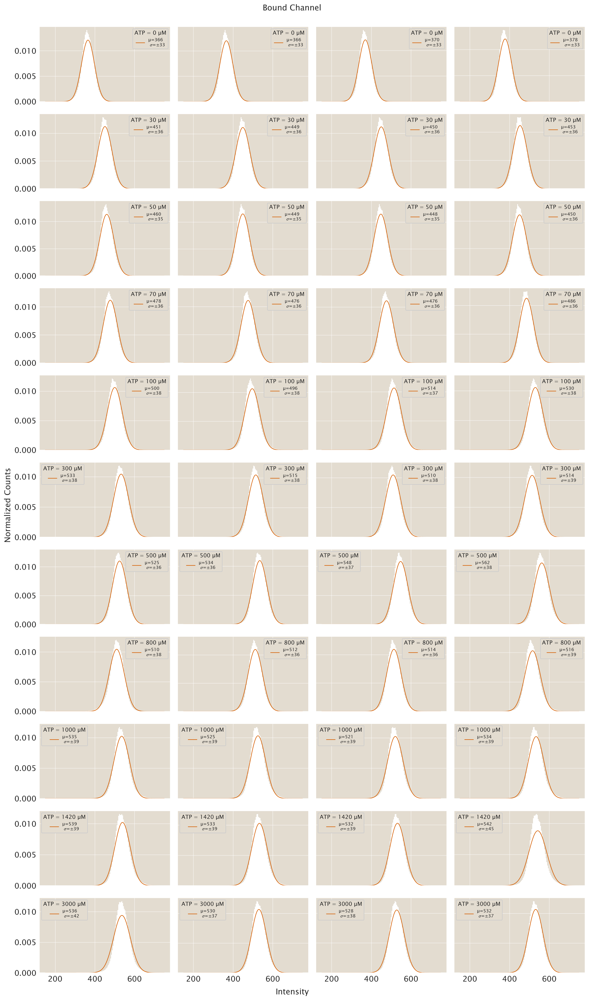

In [17]:
plot_array = np.copy(bound_norm)
range_low = 150
range_high = 750
gaussDens=lambda x, mu, sigma: (1/(np.sqrt(2*np.pi)*sigma)) * np.exp(-(x-mu)**2/(2*sigma**2))
xRange1=np.linspace(range_low, range_high, 1000)

fig, ax = plt.subplots(len(np.unique(ATPconc)), int(len(ATPconc)/len(np.unique(ATPconc))), figsize=(15,25))

for i, ATP in enumerate(np.unique(ATPconc)):
    loc = np.where(ATPconc==ATP)
    for j, val in enumerate(loc[0]):
        ax[i][j].hist(plot_array[val].flatten(), bins=150, range=(range_low, range_high), density=True, color='w', edgecolor='none')
        # ax[i][j].set_title(ATP)
        
        mean = np.nanmean(plot_array[val].flatten())
        stdev = np.nanstd(plot_array[val].flatten())
        
        ax[i][j].plot(xRange1, gaussDens(xRange1, mean, stdev), color='r', lw=1, label=f'µ={round(mean)} \n $\sigma$=±{round(stdev)}')
        ax[i][j].tick_params('x', labelbottom=False)
        ax[i][j].tick_params('y', labelleft=False)
        ax[i][j].legend(title=f'ATP = {ATP} µM', title_fontsize=10)
        
    ax[i][0].tick_params('y', labelleft=True)

for j in range(int(len(ATPconc)/len(np.unique(ATPconc)))):
    ax[-1][j].tick_params('x', labelbottom=True)
fig.supylabel('Normalized Counts')
fig.supxlabel('Intensity')
fig.suptitle('Bound Channel', y=1)
fig.tight_layout()

## Unbound Channel

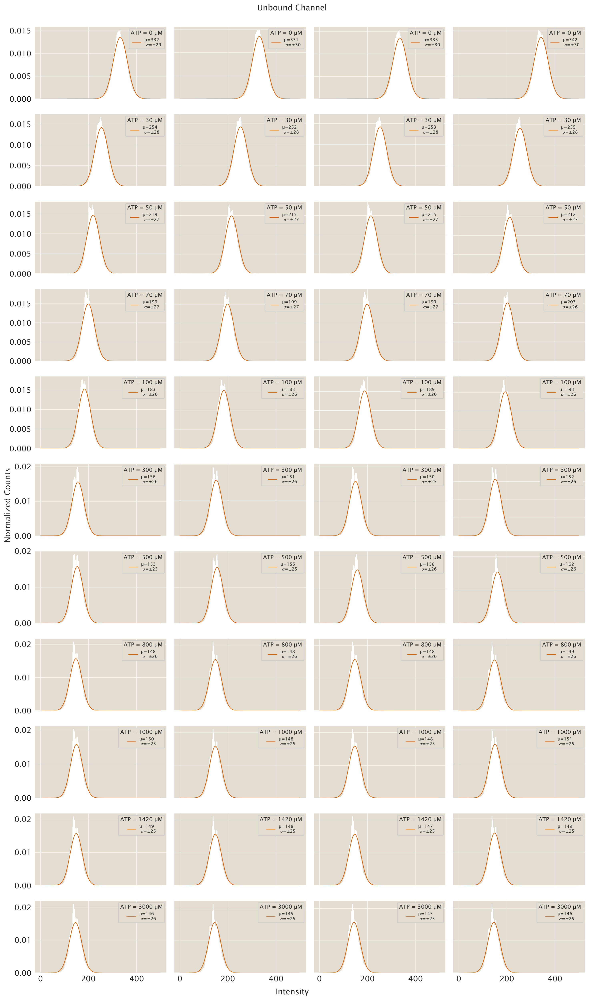

In [18]:
plot_array = np.copy(unbound_norm)
range_low = 0
range_high = 500
gaussDens=lambda x, mu, sigma: (1/(np.sqrt(2*np.pi)*sigma)) * np.exp(-(x-mu)**2/(2*sigma**2))
xRange1=np.linspace(range_low, range_high, 1000)

fig, ax = plt.subplots(len(np.unique(ATPconc)), int(len(ATPconc)/len(np.unique(ATPconc))), figsize=(15,25))

for i, ATP in enumerate(np.unique(ATPconc)):
    loc = np.where(ATPconc==ATP)
    for j, val in enumerate(loc[0]):
        ax[i][j].hist(plot_array[val].flatten(), bins=150, range=(range_low, range_high), density=True, color='w', edgecolor='none')
        # ax[i][j].set_title(ATP)
        
        mean = np.nanmean(plot_array[val].flatten())
        stdev = np.nanstd(plot_array[val].flatten())
        
        ax[i][j].plot(xRange1, gaussDens(xRange1, mean, stdev), color='r', lw=1, label=f'µ={round(mean)} \n $\sigma$=±{round(stdev)}')
        ax[i][j].tick_params('x', labelbottom=False)
        ax[i][j].tick_params('y', labelleft=False)
        ax[i][j].legend(title=f'ATP = {ATP} µM', title_fontsize=10)
        
    ax[i][0].tick_params('y', labelleft=True)

for j in range(int(len(ATPconc)/len(np.unique(ATPconc)))):
    ax[-1][j].tick_params('x', labelbottom=True)
fig.supylabel('Normalized Counts')
fig.supxlabel('Intensity')
fig.suptitle('Unbound Channel', y=1)
fig.tight_layout()

## Ratios

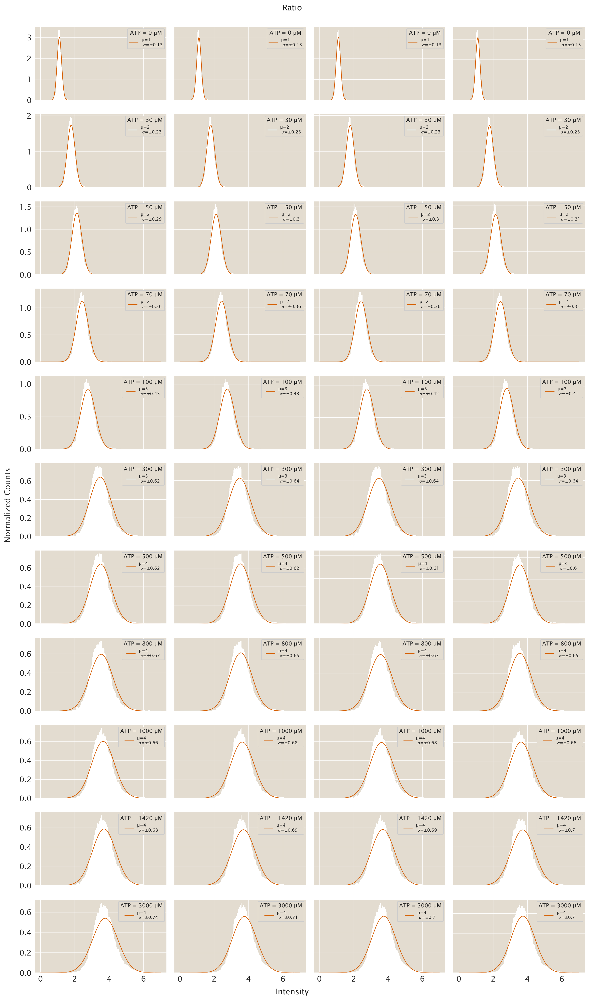

In [19]:
plot_array = np.copy(ratio_im)
range_low = 0
range_high = 7
gaussDens=lambda x, mu, sigma: (1/(np.sqrt(2*np.pi)*sigma)) * np.exp(-(x-mu)**2/(2*sigma**2))
xRange1=np.linspace(range_low, range_high, 1000)

fig, ax = plt.subplots(len(np.unique(ATPconc)), int(len(ATPconc)/len(np.unique(ATPconc))), figsize=(15,25))

for i, ATP in enumerate(np.unique(ATPconc)):
    loc = np.where(ATPconc==ATP)
    for j, val in enumerate(loc[0]):
        ax[i][j].hist(plot_array[val].flatten(), bins=150, range=(range_low, range_high), density=True, color='w', edgecolor='none')
        # ax[i][j].set_title(ATP)
        
        mean = np.nanmean(plot_array[val].flatten())
        stdev = np.nanstd(plot_array[val].flatten())
        
        ax[i][j].plot(xRange1, gaussDens(xRange1, mean, stdev), color='r', lw=1, label=f'µ={round(mean)} \n $\sigma$=±{round(stdev,2)}')
        ax[i][j].tick_params('x', labelbottom=False)
        ax[i][j].tick_params('y', labelleft=False)
        ax[i][j].legend(title=f'ATP = {ATP} µM', title_fontsize=10)
        #ax[i][j].set_yscale('log')
        
    ax[i][0].tick_params('y', labelleft=True)

for j in range(int(len(ATPconc)/len(np.unique(ATPconc)))):
    ax[-1][j].tick_params('x', labelbottom=True)
fig.supylabel('Normalized Counts')
fig.supxlabel('Intensity')
fig.suptitle('Ratio', y=1)
fig.tight_layout()

# Spatial check

Notes:
1) does the way we correct for uneven illumination make sense? We want to make sure that the spatial gradients across the image are eliminated such that true pixel values don't depend on a pixels position.
2) The normalization function seems to mess things up. There is a median filter that eliminates hot pixels but creates a lot of bandings that are likley the origin of the "waves" in Najma's data.
3) does it make the most sense to not do median filtering and only gaussian filter? If so, what is the correct blur radius. Intuition, the smaller the radius, the more similar to the original image. If the gaussian radius is infinitely big, the image is effectively just averaged. then when dividing no spatial infor would be kept.

Grid options 
- 10x10 each cell 192x126
- 32x21 each cell 60x60
- 64x42 each cell 30x30

In [20]:
def quickGridDivide(test_im, n_rows, n_cols):
    """ Computes mean & standard deviation of local blocks of test_im, in a coarse grid of size n_rows x n_cols  """
    
    # preallocate
    test_means = np.zeros_like(test_im)
    test_stds = np.zeros_like(test_im)
    
    pxperrow, pxpercol = test_im.shape[0]//n_rows,  test_im.shape[1]//n_cols
    
    for i in range(n_rows):
        for j in range(n_cols):
            crop = np.s_[i*pxperrow:(i+1)*pxperrow, j*pxpercol:(j+1)*pxpercol]
            test_crop = test_im[crop]

            test_means[crop]+=np.nanmean(test_crop)
            test_stds[crop]+=np.nanstd(test_crop)
        
    return test_means, test_stds

# After uneven correction

In [60]:
#look at images for 1000uM atp lets try averaging them as the throw away
#test_bss = bound_bs[np.where(ATPconc==1000)]
test_bs = bound_bs[0]#np.average(test_bss, axis=(0))

#define a blur radius for gaussian blurring
rblur=3

## Use median filter

In [22]:
im_median = skimage.filters.median(test_bs, skimage.morphology.disk(10.0))
im_blur=skimage.filters.gaussian(im_median, rblur)

ims_norm = test_bs*im_blur.max()/im_blur

View the result

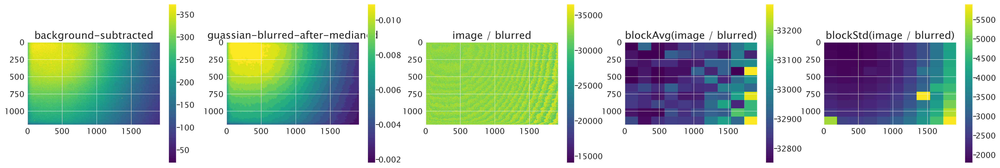

In [23]:
## now with median
fig, ax=plt.subplots(1,5,figsize=(30,5))
im0=ax[0].imshow(test_bs, vmin=test_bs.min(), vmax=np.percentile(test_bs, 99))
fig.colorbar(im0, ax=ax[0])
ax[0].set_title('background-subtracted')

im1=ax[1].imshow(im_blur,  vmin=im_blur.min(), vmax=np.percentile(im_blur, 99))
fig.colorbar(im1, ax=ax[1])
ax[1].set_title('guassian-blurred-after-medianed')


im2=ax[2].imshow(test_bs/im_blur, vmin=1.9*(test_bs/im_blur).min(), vmax=np.percentile(test_bs/im_blur, 90))
ax[2].set_title('image / blurred')
fig.colorbar(im2, ax=ax[2])

## avg
# compute blocked average
postBlurBlockMeans, postBlurBlockStds = quickGridDivide(test_bs/im_blur, n_rows=10, n_cols=10)
im3=ax[3].imshow(postBlurBlockMeans, vmin=np.percentile(postBlurBlockMeans, 5), vmax=np.percentile(postBlurBlockMeans, 99))
ax[3].set_title('blockAvg(image / blurred)')
fig.colorbar(im3, ax=ax[3])

im4=ax[4].imshow(postBlurBlockStds, vmin=postBlurBlockStds.min(), vmax=np.percentile(postBlurBlockStds, 99))
ax[4].set_title('blockStd(image / blurred)')
fig.colorbar(im4, ax=ax[4])

Text(0.02, 0.5, 'Intensity Std')

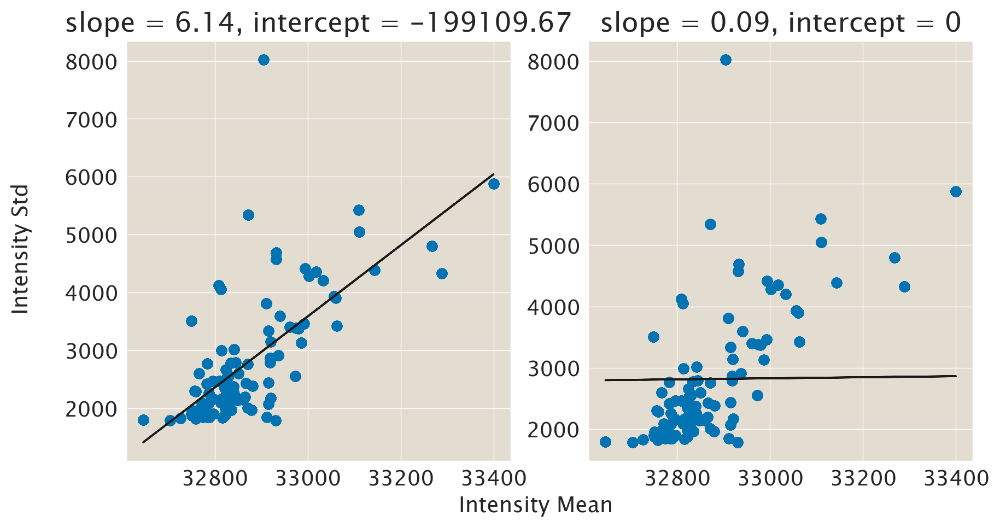

In [24]:
plot_means = postBlurBlockMeans[postBlurBlockMeans>0]
plot_stds = postBlurBlockStds[postBlurBlockStds>0]

# Our model is y = a * x, so things are quite simple, in this case...
# x needs to be a column vector instead of a 1D vector for this, however.
plot_means = plot_means[:,np.newaxis]

fig, ax = plt.subplots(1,2, figsize=(10,5))

coefficients, cov= np.polyfit(plot_means.flatten(),plot_stds.flatten(), deg=1, cov='unscaled')
conf_int = np.sqrt(np.diag(cov))
# Create a polynomial function using the coefficients
poly_function = np.poly1d(coefficients)
# Generate y values for the fitted line
y_fit = poly_function(plot_means.flatten())

ax[0].scatter(plot_means.flatten(), plot_stds.flatten())
ax[0].plot(plot_means.flatten(), y_fit, color='k', label=f'slope = {round(coefficients[0],2)}±{round(conf_int[0],5)}, intercept = {round(coefficients[1],2)}±{round(conf_int[1],2)}')
ax[0].set_title(f'slope = {round(coefficients[0],2)}, intercept = {round(coefficients[1],2)}')

#-------
slope, _, _, _ = np.linalg.lstsq(plot_means, plot_stds, rcond=None)
y_fit = plot_means.flatten()*slope[0]

ax[1].scatter(plot_means.flatten(), plot_stds.flatten())
ax[1].plot(plot_means.flatten(), y_fit, color='k')#, label=f'slope = {round(slope,2)}±{round(conf_int[0],5)}, intercept = {round(coefficients[1],2)}±{round(conf_int[1],2)}')
ax[1].set_title(f'slope = {round(slope[0], 2)}, intercept = {0}')

#---
fig.supxlabel('Intensity Mean')
fig.supylabel('Intensity Std')

# No median filter Image

In [61]:
im_blur=skimage.filters.gaussian(test_bs, rblur)

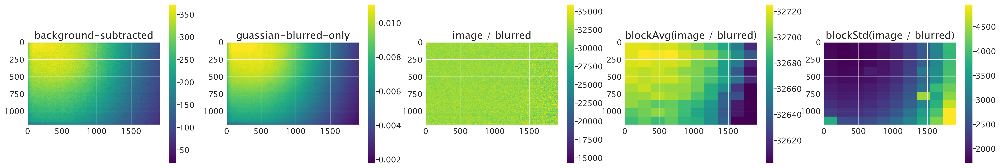

In [62]:
fig, ax=plt.subplots(1,5,figsize=(30,5))
im0=ax[0].imshow(test_bs, vmin=test_bs.min(), vmax=np.percentile(test_bs, 99))
fig.colorbar(im0, ax=ax[0])
ax[0].set_title('background-subtracted')

rblur=3
im_blur=skimage.filters.gaussian(test_bs, rblur)
im1=ax[1].imshow(im_blur,  vmin=im_blur.min(), vmax=np.percentile(im_blur, 99))
fig.colorbar(im1, ax=ax[1])
ax[1].set_title('guassian-blurred-only')


im2=ax[2].imshow(test_bs/im_blur, vmin=1.9*(test_bs/im_blur).min(), vmax=np.percentile(test_bs/im_blur, 90))
ax[2].set_title('image / blurred')
fig.colorbar(im2, ax=ax[2])

## avg
# compute blocked average
postBlurBlockMeans, postBlurBlockStds = quickGridDivide(test_bs/im_blur, n_rows=10, n_cols=10)
im3=ax[3].imshow(postBlurBlockMeans, vmin=np.percentile(postBlurBlockMeans, 5), vmax=np.percentile(postBlurBlockMeans, 99))
ax[3].set_title('blockAvg(image / blurred)')
fig.colorbar(im3, ax=ax[3])

im4=ax[4].imshow(postBlurBlockStds, vmin=postBlurBlockStds.min(), vmax=np.percentile(postBlurBlockStds, 99))
ax[4].set_title('blockStd(image / blurred)')
fig.colorbar(im4, ax=ax[4])

Text(0.02, 0.5, 'Intensity Std')

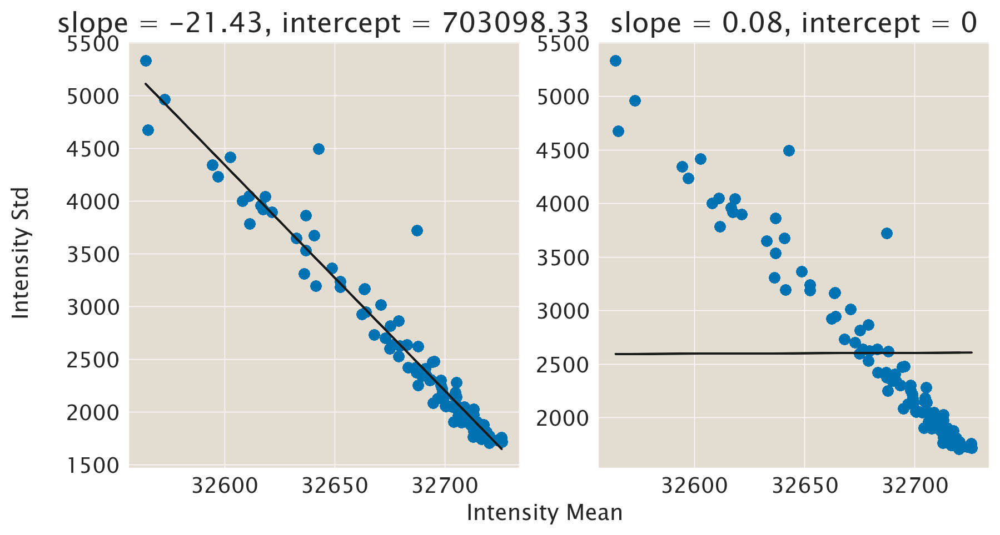

In [63]:
plot_means = postBlurBlockMeans[postBlurBlockMeans>0]
plot_stds = postBlurBlockStds[postBlurBlockStds>0]

# Our model is y = a * x, so things are quite simple, in this case...
# x needs to be a column vector instead of a 1D vector for this, however.
plot_means = plot_means[:,np.newaxis]

fig, ax = plt.subplots(1,2, figsize=(10,5))

coefficients, cov= np.polyfit(plot_means.flatten(),plot_stds.flatten(), deg=1, cov='unscaled')
conf_int = np.sqrt(np.diag(cov))
# Create a polynomial function using the coefficients
poly_function = np.poly1d(coefficients)
# Generate y values for the fitted line
y_fit = poly_function(plot_means.flatten())

ax[0].scatter(plot_means.flatten(), plot_stds.flatten())
ax[0].plot(plot_means.flatten(), y_fit, color='k', label=f'slope = {round(coefficients[0],2)}±{round(conf_int[0],5)}, intercept = {round(coefficients[1],2)}±{round(conf_int[1],2)}')
ax[0].set_title(f'slope = {round(coefficients[0],2)}, intercept = {round(coefficients[1],2)}')

#-------
slope, _, _, _ = np.linalg.lstsq(plot_means, plot_stds, rcond=None)
y_fit = plot_means.flatten()*slope[0]

ax[1].scatter(plot_means.flatten(), plot_stds.flatten())
ax[1].plot(plot_means.flatten(), y_fit, color='k')#, label=f'slope = {round(slope,2)}±{round(conf_int[0],5)}, intercept = {round(coefficients[1],2)}±{round(conf_int[1],2)}')
ax[1].set_title(f'slope = {round(slope[0], 2)}, intercept = {0}')

#---
fig.supxlabel('Intensity Mean')
fig.supylabel('Intensity Std')

Let's try doing the procedure (without the median filtering) on each image and see how thye all compare. I will use the blur of each image as the normalization factor.

In [80]:
r_blur=3
num_rows=10
num_cols=10
test_array = np.copy(bound_bs)

all_blo_means = np.zeros_like(test_array, dtype=np.float64)
all_blo_stds = np.zeros_like(test_array, dtype=np.float64)

for i, ATP in enumerate(tqdm(ATPconc)):
    test_bs = test_array[i]
    im_blur=skimage.filters.gaussian(test_bs, rblur)
    postBlurBlockMeans, postBlurBlockStds = quickGridDivide(test_bs/im_blur, n_rows=num_rows, n_cols=num_cols)
    all_blo_means[i] += postBlurBlockMeans
    all_blo_stds[i] += postBlurBlockStds
    
coord_x = np.arange(len(test_bs)/(2*num_rows), len(test_bs), len(test_bs)/num_rows)
coord_y = np.arange(len(test_bs[0])/(2*num_cols), len(test_bs[0]), len(test_bs[0])/num_cols)


  0%|          | 0/44 [00:00<?, ?it/s]

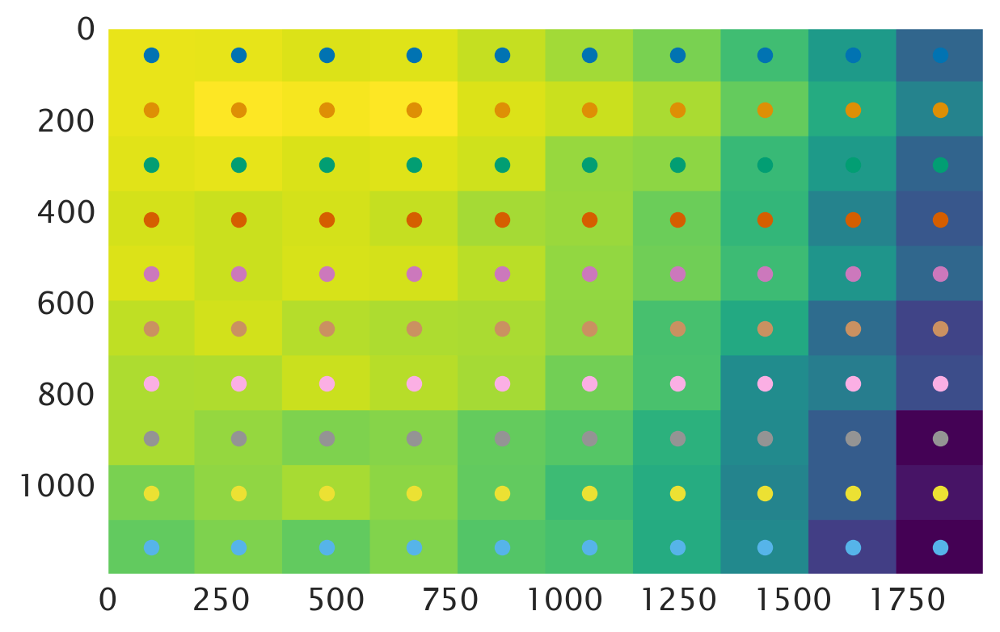

In [81]:
plt.imshow(all_blo_means[0])
plt.grid(False)
for i in coord_y:
    for j in coord_x:
        plt.scatter(i, j)

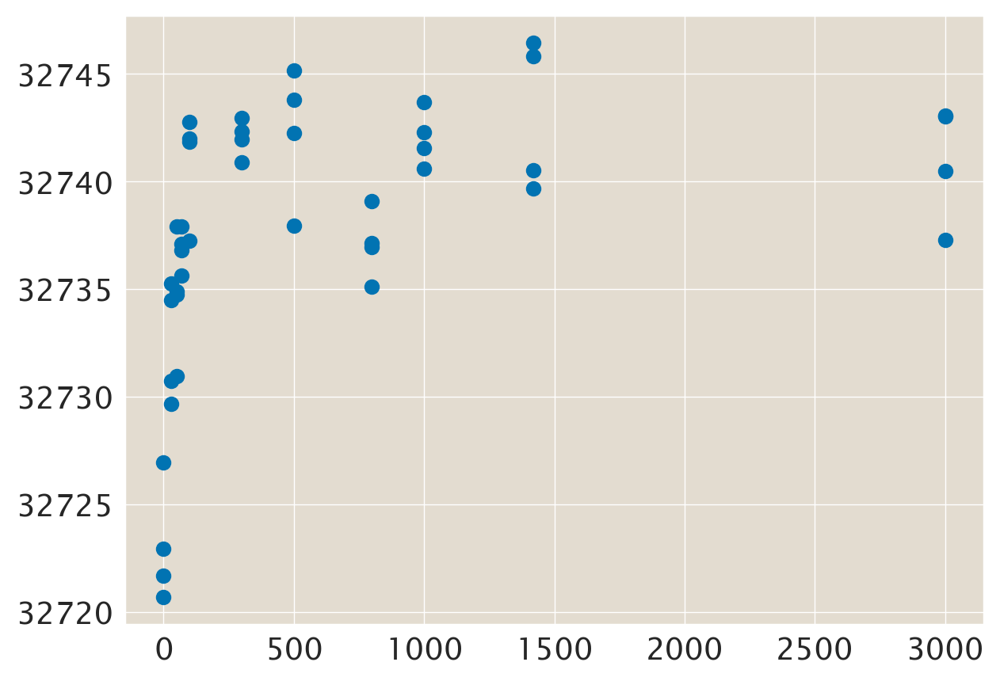

In [69]:
plt.scatter(ATPconc, all_blo_means[:,100,100])

Text(0.02, 0.5, 'Intensity Std')

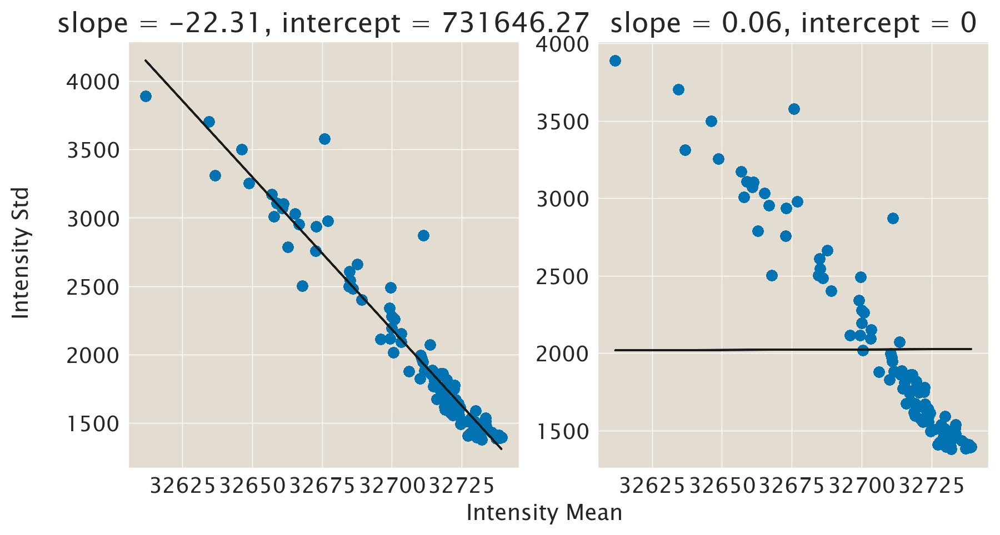

In [83]:
demi_index=10
plot_means = all_blo_means[demi_index][all_blo_means[demi_index]>0]
plot_stds = all_blo_stds[demi_index][all_blo_means[demi_index]>0]

# Our model is y = a * x, so things are quite simple, in this case...
# x needs to be a column vector instead of a 1D vector for this, however.
plot_means = plot_means[:,np.newaxis]

fig, ax = plt.subplots(1,2, figsize=(10,5))

coefficients, cov= np.polyfit(plot_means.flatten(),plot_stds.flatten(), deg=1, cov='unscaled')
conf_int = np.sqrt(np.diag(cov))
# Create a polynomial function using the coefficients
poly_function = np.poly1d(coefficients)
# Generate y values for the fitted line
y_fit = poly_function(plot_means.flatten())

ax[0].scatter(plot_means.flatten(), plot_stds.flatten())
ax[0].plot(plot_means.flatten(), y_fit, color='k', label=f'slope = {round(coefficients[0],2)}±{round(conf_int[0],5)}, intercept = {round(coefficients[1],2)}±{round(conf_int[1],2)}')
ax[0].set_title(f'slope = {round(coefficients[0],2)}, intercept = {round(coefficients[1],2)}')

#-------
slope, _, _, _ = np.linalg.lstsq(plot_means, plot_stds, rcond=None)
y_fit = plot_means.flatten()*slope[0]

ax[1].scatter(plot_means.flatten(), plot_stds.flatten())
ax[1].plot(plot_means.flatten(), y_fit, color='k')#, label=f'slope = {round(slope,2)}±{round(conf_int[0],5)}, intercept = {round(coefficients[1],2)}±{round(conf_int[1],2)}')
ax[1].set_title(f'slope = {round(slope[0], 2)}, intercept = {0}')

#---
fig.supxlabel('Intensity Mean')
fig.supylabel('Intensity Std')

# blah blah blah

Plot the standard deviation vs the mean

Text(0.02, 0.5, 'Intensity Std')

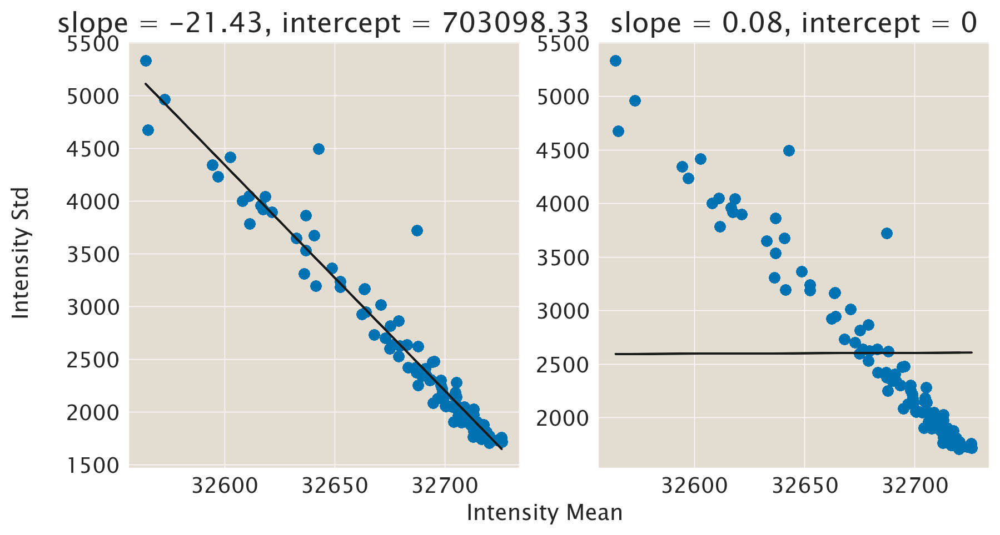

In [34]:
plot_means = postBlurBlockMeans[postBlurBlockMeans>0]
plot_stds = postBlurBlockStds[postBlurBlockStds>0]

# Our model is y = a * x, so things are quite simple, in this case...
# x needs to be a column vector instead of a 1D vector for this, however.
plot_means = plot_means[:,np.newaxis]

fig, ax = plt.subplots(1,2, figsize=(10,5))

coefficients, cov= np.polyfit(plot_means.flatten(),plot_stds.flatten(), deg=1, cov='unscaled')
conf_int = np.sqrt(np.diag(cov))
# Create a polynomial function using the coefficients
poly_function = np.poly1d(coefficients)
# Generate y values for the fitted line
y_fit = poly_function(plot_means.flatten())

ax[0].scatter(plot_means.flatten(), plot_stds.flatten())
ax[0].plot(plot_means.flatten(), y_fit, color='k', label=f'slope = {round(coefficients[0],2)}±{round(conf_int[0],5)}, intercept = {round(coefficients[1],2)}±{round(conf_int[1],2)}')
ax[0].set_title(f'slope = {round(coefficients[0],2)}, intercept = {round(coefficients[1],2)}')

#-------
slope, _, _, _ = np.linalg.lstsq(plot_means, plot_stds, rcond=None)
y_fit = plot_means.flatten()*slope[0]

ax[1].scatter(plot_means.flatten(), plot_stds.flatten())
ax[1].plot(plot_means.flatten(), y_fit, color='k')#, label=f'slope = {round(slope,2)}±{round(conf_int[0],5)}, intercept = {round(coefficients[1],2)}±{round(conf_int[1],2)}')
ax[1].set_title(f'slope = {round(slope[0], 2)}, intercept = {0}')

#---
fig.supxlabel('Intensity Mean')
fig.supylabel('Intensity Std')

Text(0.5, 1.0, 'slope = 3.8780809351296655, intercept = -4.168102763985772')

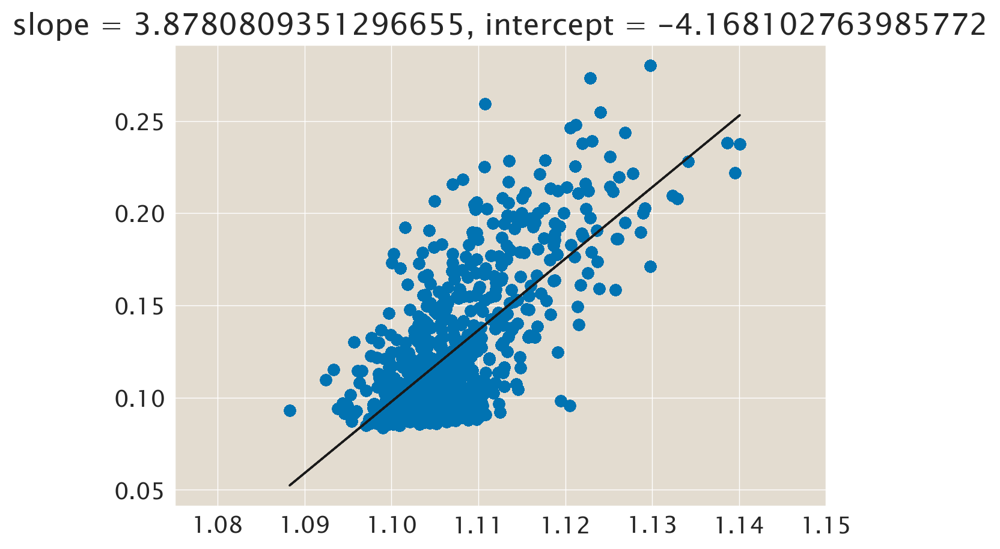

In [106]:
plot_means = test_means[test_means>0]
plot_stds = test_stds[test_stds>0]

plt.scatter(plot_means.flatten(), plot_stds.flatten())
plt.xlim(1.075, 1.15)

coef = numpy.linalg.lstsq(test_means, test_stds)

coefficients, cov= np.polyfit(plot_means.flatten(),plot_stds.flatten(), deg=1, cov='unscaled')
conf_int = np.sqrt(np.diag(cov))
# Create a polynomial function using the coefficients
poly_function = np.poly1d(coefficients)
# Generate y values for the fitted line
y_fit = poly_function(plot_means.flatten())

plt.plot(plot_means.flatten(), y_fit, color='k', label=f'slope = {round(coefficients[0],2)}±{round(conf_int[0],5)}, intercept = {round(coefficients[1],2)}±{round(conf_int[1],2)}')
plt.title(f'slope = {coefficients[0]}, intercept = {coefficients[1]}')

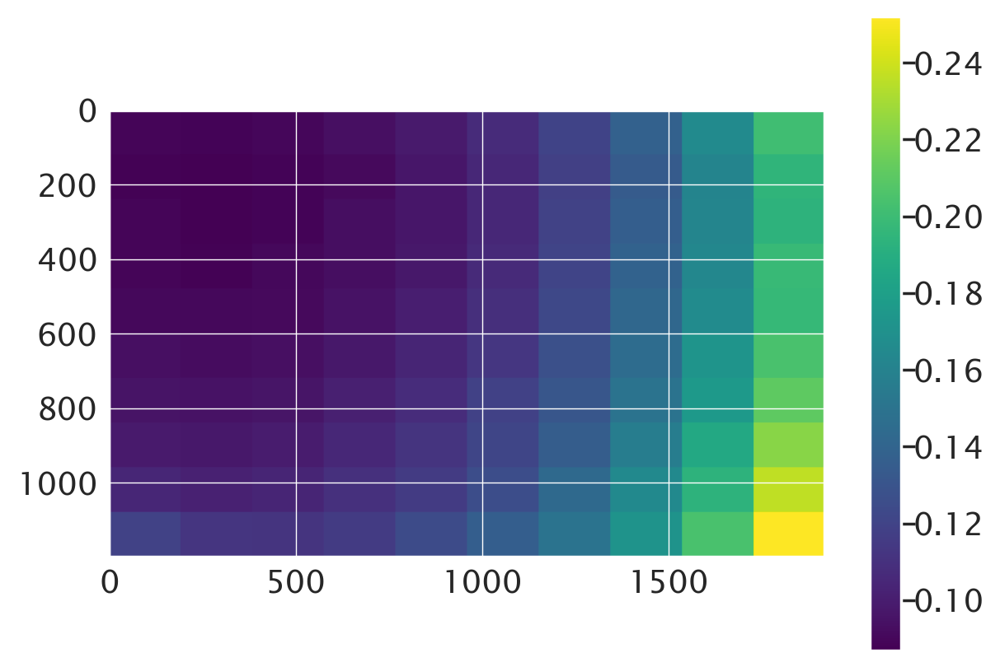

In [40]:
plt.imshow(test_stds)
plt.colorbar()

In [28]:
ratio_im[0].shape

(1200, 1920)

In [32]:
test_im.shape[0]//10 

120

## raw image

In [ ]:
def norm_mat_fn_iATP(im_ref, im_dark, r_blur=3):
    """
    Generate a normalization matrix from a reference image.
    
    This function corrects for uneven illumination. It takes in a reference image which should be the zero 
    ATP control. It then finds the brightest point of the image and for each pixel replaces the pixel value 
    with (brightest pixel value)/(initial pixel value). This creates a matrix that when multiplied by the 
    original image with flatten the illumination and raise every pixel to the brightest value. You can then 
    multiply this normalization matrix by all other images in the dataset to flatten the illumination in each image.

    It is assumed that the reference image is taken for a sample with a spatially uniform protein concentration. The 
    normalization value is everywhere greater than 1, except at the position of the highest illumination.
    
    Parameters
    ----------
    im_ref : numpy array
        Reference image (e.g., the first frame in the MT channel).
    
    offset_camera : float
        Camera offset (not accounting for autofluorescence).
        
    r_blur : float
        Radius of blurring to be performed on the reference image 
        in order to remove noise and short length scale nonuniformities [px].
        
    Returns
    -------
    norm_mat : numpy array
        Normalization matrix
    """
    
    # Convert image into a float type
    im_ref = im_ref.astype(float)
    
    # Subtract the camera offset
    im = im_ref - im_dark
    
    # Rescale the image down for faster denoising
    rescale = 4.0
    im_resized = skimage.transform.rescale(im, 1/rescale)
    
    # Median filter to remove hot pixels
    im_median = skimage.filters.median(im_resized, skimage.morphology.disk(10.0))
    
    # Gaussian blur the image
    im_blur = skimage.filters.gaussian(im_median, r_blur)
    
    # Find the location of the peak
    ind_max = np.where(im_blur == im_blur.max())
    i_center, j_center = ind_max[0][0], ind_max[1][0]
    
    # Peak fluorescence in the normalization image
    fluo_peak = im_blur[i_center, j_center]
    
    # Normalization matrix
    norm_mat = fluo_peak/im_blur 
    
    # Scale up the normalization matrix to the original size
    norm_mat = skimage.transform.rescale(norm_mat, rescale)
    
    return norm_mat


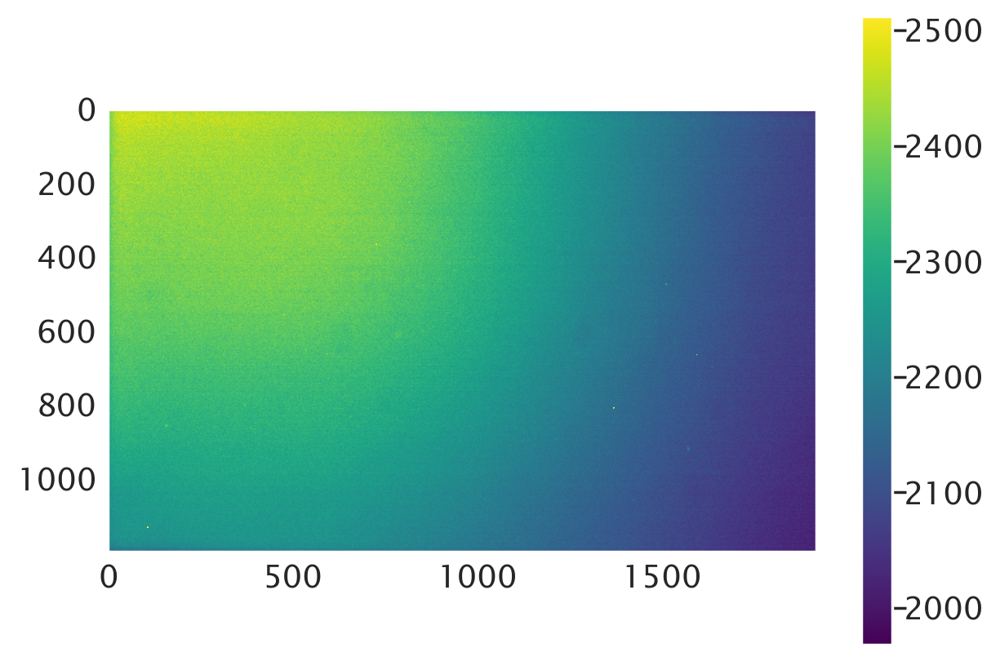

In [191]:
test_im=bound_array[4]
plt.imshow(test_im, vmin=test_im.min(), vmax = np.percentile(test_im, 99.99))
plt.grid(False)
plt.colorbar()

Median filter, look there are waves?!?!? seems concerning and possibly the origin of all the waves in Najmas data

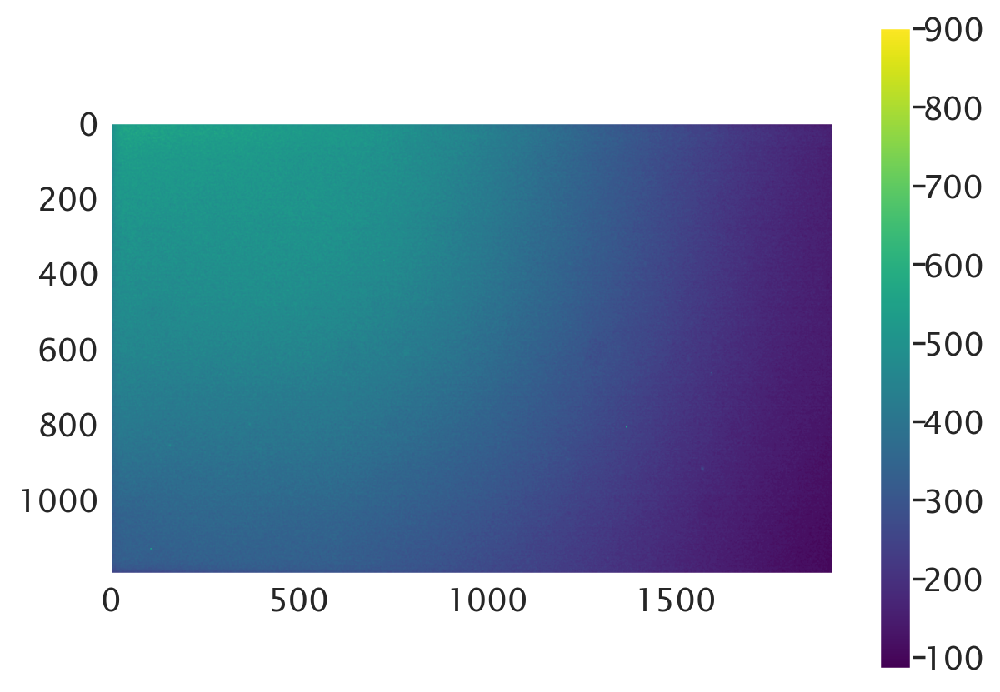

In [192]:
test_bs = test_im-bound_bg
im_median = skimage.filters.median(test_bs, skimage.morphology.disk(2.))
plt.imshow(im_median)
plt.colorbar()
plt.grid(False)

Here is a subset of the data that shows the effect on nearby pixels. We cna now see if adding the gaussian blur over this removes the artifacts of waves or not

array([[437, 437, 453, 453, 469, 469, 485, 485, 485, 485],
       [437, 453, 469, 453, 469, 469, 485, 485, 485, 485],
       [453, 453, 453, 469, 469, 469, 485, 485, 485, 485],
       [453, 453, 453, 469, 469, 485, 501, 501, 501, 501],
       [453, 453, 453, 469, 469, 501, 501, 517, 517, 517],
       [453, 453, 469, 469, 501, 501, 501, 501, 517, 517],
       [453, 469, 469, 485, 501, 501, 501, 501, 517, 517],
       [469, 469, 469, 469, 485, 501, 485, 501, 501, 501],
       [453, 469, 469, 469, 501, 469, 469, 485, 501, 501],
       [453, 469, 469, 469, 469, 469, 469, 485, 501, 501]], dtype=int16)

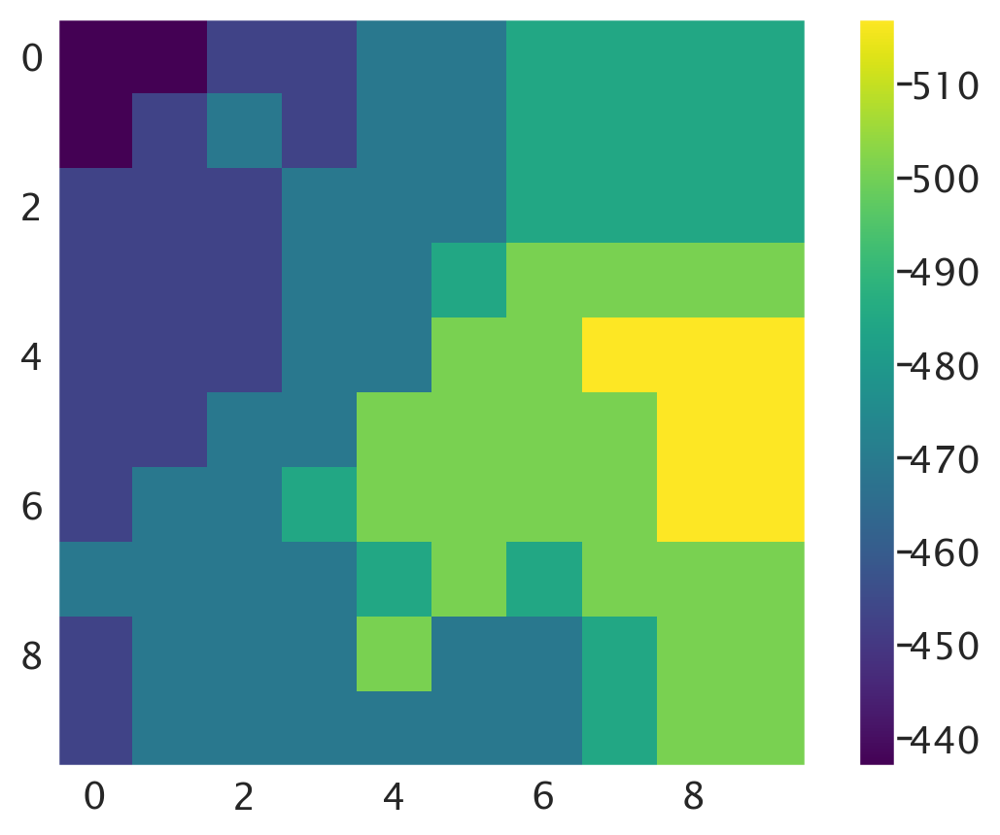

In [193]:
test_bs = test_im-bound_bg
im_median = skimage.filters.median(test_bs, skimage.morphology.disk(2.0))
plt.imshow(im_median[:10, :10])
plt.colorbar()
plt.grid(False)

im_median[:10, :10]


For some historical reason I set rblur=3, - Alas, the waves remain - what would be the right blur radius???

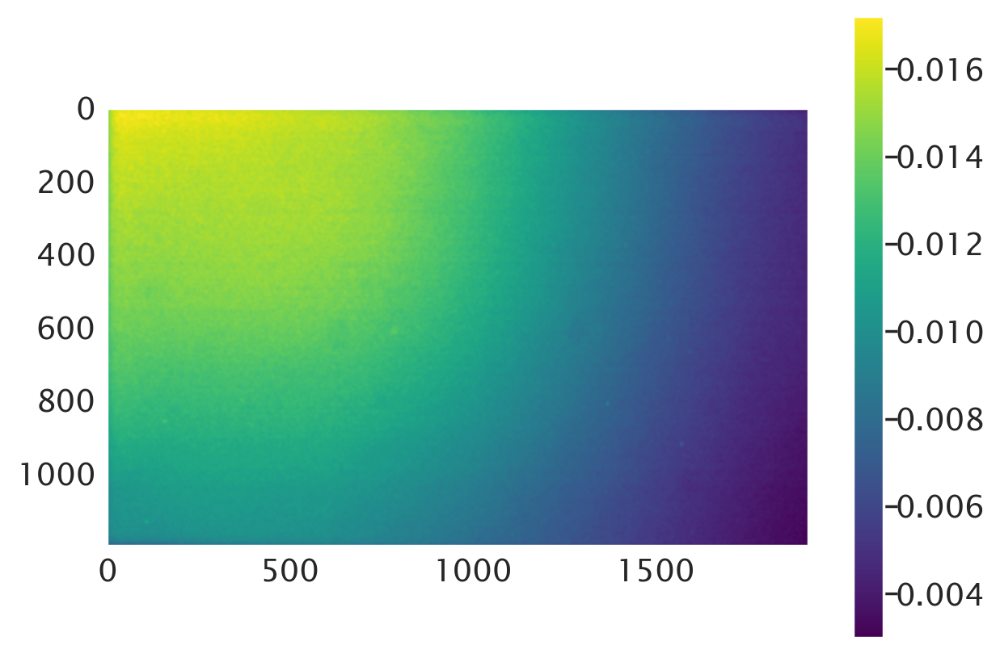

In [198]:
im_blur = skimage.filters.gaussian(im_median, 3)
plt.imshow(im_blur)
plt.colorbar()
plt.grid(False)

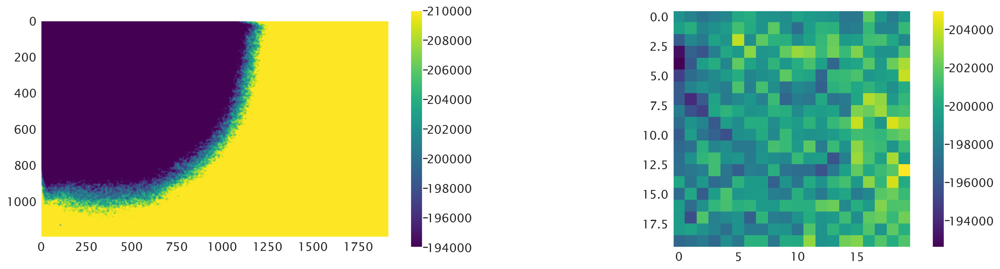

In [201]:
test_ev = test_im/im_blur

# normalize = mcolors.LogNorm(vmin=test_ev.min(), vmax=np.percentile(test_ev, 99.99))
# #colormap = cm.plasma
# scalarmappable = cm.ScalarMappable(norm=normalize, cmap=colormap)
# scalarmappable.set_array(ATPconc)

fig, ax = plt.subplots(1,2, figsize=(20,5))

img1 = ax[0].imshow(test_ev, vmin=194000, vmax=210000)
#img1 = ax[0].imshow(test_ev, vmin=194000, vmax=210000)
img2 = ax[1].imshow(test_ev[600:620, 1000:1020])

ax[0].grid(False)
ax[1].grid(False)


#cbar1 = fig.colorbar(mappable=scalarmappable, cax=img1, ax=ax[0])
cbar1 = fig.colorbar(img1, ax=ax[0])
cbar2 = fig.colorbar(img2, ax=ax[1])

what does the gaussian filter look like if i dont do the median

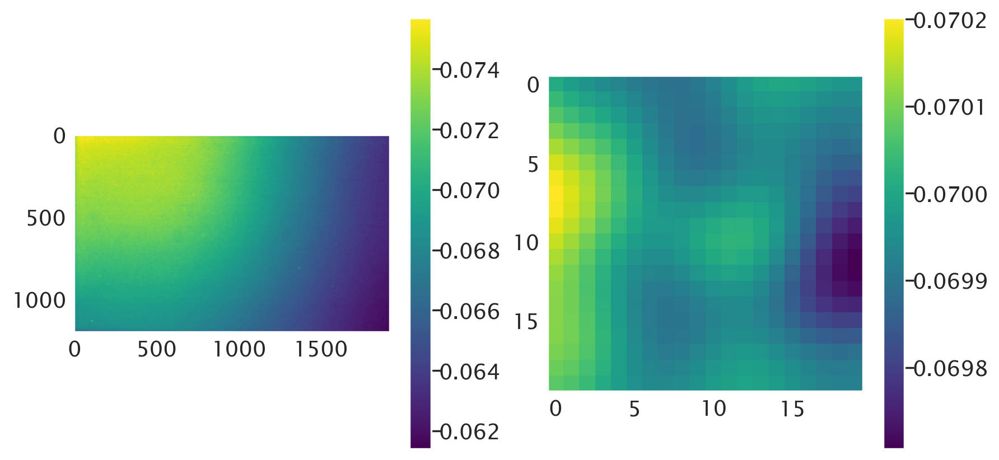

In [189]:
rblur=3

fig, ax = plt.subplots(1,2, figsize=(10,5))

im_blur = skimage.filters.gaussian(test_im, rblur)

img1=ax[0].imshow(im_blur)
img2=ax[1].imshow(im_blur[600:620, 1000:1020])

ax[0].grid(False)
ax[1].grid(False)

cbar1 = fig.colorbar(img1, ax=ax[0])
cbar2 = fig.colorbar(img2, ax=ax[1])

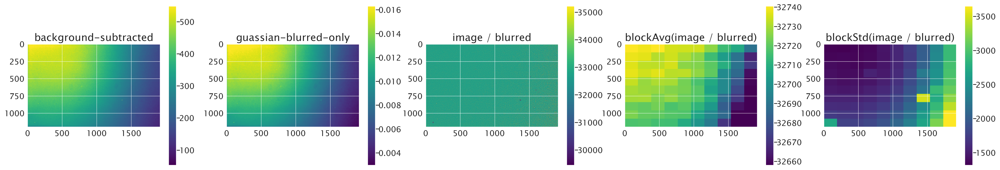

In [239]:
fig, ax=plt.subplots(1,5,figsize=(30,5))
im0=ax[0].imshow(test_bs, vmin=test_bs.min(), vmax=np.percentile(test_bs, 99))
fig.colorbar(im0, ax=ax[0])
ax[0].set_title('background-subtracted')

rblur=3
im_blur=skimage.filters.gaussian(test_bs, rblur)
im1=ax[1].imshow(im_blur,  vmin=im_blur.min(), vmax=np.percentile(im_blur, 99))
fig.colorbar(im1, ax=ax[1])
ax[1].set_title('guassian-blurred-only')


im2=ax[2].imshow(test_bs/im_blur, vmin=1.9*(test_bs/im_blur).min(), vmax=np.percentile(test_bs/im_blur, 90))
ax[2].set_title('image / blurred')
fig.colorbar(im2, ax=ax[2])

## avg
# compute blocked average
postBlurBlockMeans, postBlurBlockStds = quickGridDivide(test_bs/im_blur, n_rows=10, n_cols=10)
im3=ax[3].imshow(postBlurBlockMeans, vmin=np.percentile(postBlurBlockMeans, 5), vmax=np.percentile(postBlurBlockMeans, 99))
ax[3].set_title('blockAvg(image / blurred)')
fig.colorbar(im3, ax=ax[3])

im4=ax[4].imshow(postBlurBlockStds, vmin=postBlurBlockStds.min(), vmax=np.percentile(postBlurBlockStds, 99))
ax[4].set_title('blockStd(image / blurred)')
fig.colorbar(im4, ax=ax[4])

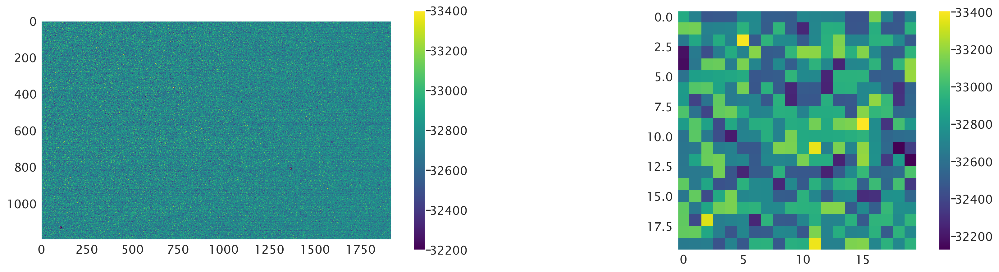

In [190]:

test_ev = test_im/im_blur

# normalize = mcolors.LogNorm(vmin=test_ev.min(), vmax=np.percentile(test_ev, 99.99))
# #colormap = cm.plasma
# scalarmappable = cm.ScalarMappable(norm=normalize, cmap=colormap)
# scalarmappable.set_array(ATPconc)

fig, ax = plt.subplots(1,2, figsize=(20,5))

img1 = ax[0].imshow(test_ev, vmin=32200, vmax=33400)
img2 = ax[1].imshow(test_ev[600:620, 1000:1020])

ax[0].grid(False)
ax[1].grid(False)


#cbar1 = fig.colorbar(mappable=scalarmappable, cax=img1, ax=ax[0])
cbar1 = fig.colorbar(img1, ax=ax[0])
cbar2 = fig.colorbar(img2, ax=ax[1])

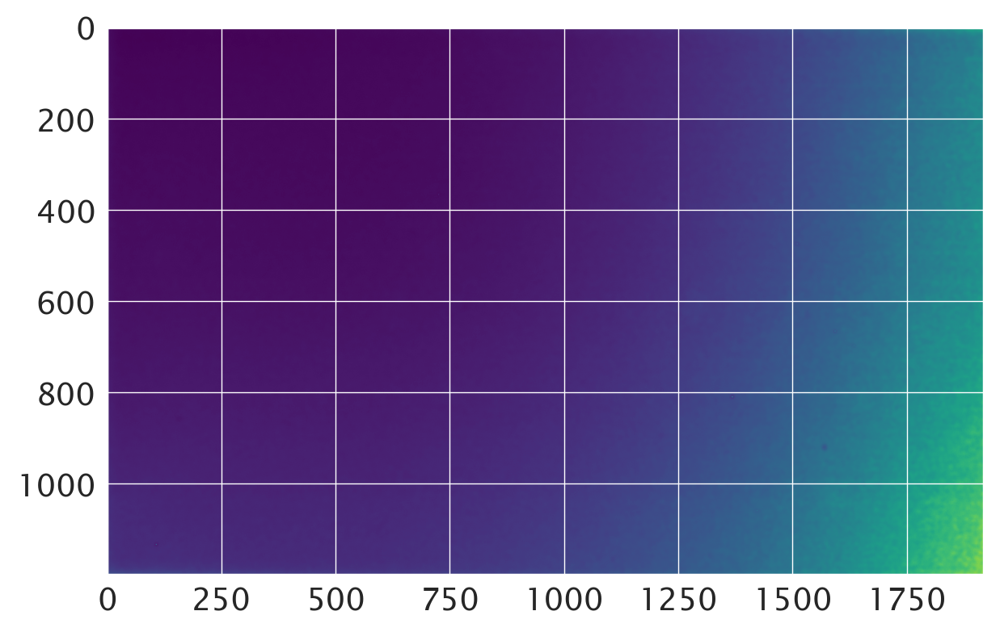

In [197]:
## Is the above image (just gaussian blurred with small sigma radius 3) secretly still hiding big spatial variation? to visualize this, we blur yet again just to peek
plt.imshow(test_ev)

In [ ]:
test_means = np.zeros_like(test_im)
test_stds = np.zeros_like(test_im)
for i in range(n_rows):
    for j in range(n_cols):
        crop = np.s_[i*pxperrow:(i+1)*pxperrow, j*pxpercol:(j+1)*pxpercol]
        test_crop = test_im[crop]
        
        test_means[crop]+=np.nanmean(test_crop)
        test_stds[crop]+=np.nanstd(test_crop)

# variance scales with increase in image brightness

In [94]:
test_im=ratio_im[20]
print(np.nanstd(test_im), np.nanstd(test_im*5),  np.nanstd(test_im*5)/np.nanstd(test_im))

0.6212074516365409 3.1060372581827047 5.0


# Blah blah blah

In [184]:
for i, ATP in enumerate(np.unique(ATPconc)):
    loc = np.where(ATPconc==ATP)
    print(loc)
    for j, val in enumerate(loc[0]):
        print(j, val)

(array([0, 1, 2, 3]),)
0 0
1 1
2 2
3 3
(array([24, 25, 26, 27]),)
0 24
1 25
2 26
3 27
(array([32, 33, 34, 35]),)
0 32
1 33
2 34
3 35
(array([36, 37, 38, 39]),)
0 36
1 37
2 38
3 39
(array([ 8,  9, 10, 11]),)
0 8
1 9
2 10
3 11
(array([20, 21, 22, 23]),)
0 20
1 21
2 22
3 23
(array([28, 29, 30, 31]),)
0 28
1 29
2 30
3 31
(array([40, 41, 42, 43]),)
0 40
1 41
2 42
3 43
(array([4, 5, 6, 7]),)
0 4
1 5
2 6
3 7
(array([12, 13, 14, 15]),)
0 12
1 13
2 14
3 15
(array([16, 17, 18, 19]),)
0 16
1 17
2 18
3 19


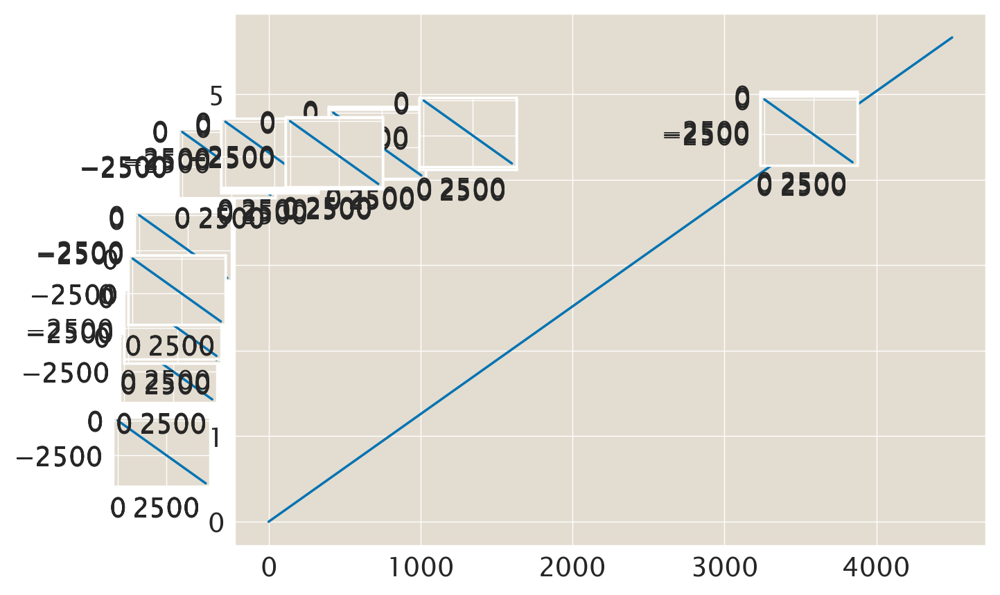

In [159]:
# Different functions in different axis
x= np.arange(0,(1.5*ATPconc.max()),1)
y1 = np.arange(0,(1.5*ratio_mean.max()),(1.5*ratio_mean.max()/len(x)))
y2 = -1*x +3

# plot
ax1 = plt.axes() # standard axes
ax1.plot(x,y1)
for i, ATP in enumerate(ATPconc):
    ax2 = plt.axes([ATP/(1.5*ATPconc.max()), ratio_mean[i]/(1.5*ratio_mean.max()), 0.1, 0.1])
#ax2 = plt.axes([ATP/ATPconc.max(), 0.3, 0.1, 0.1])
    ax2.plot(x,y2)



In [149]:
ratio_mean[i]/(1.1*ratio_mean.max())

0.8572822947135269

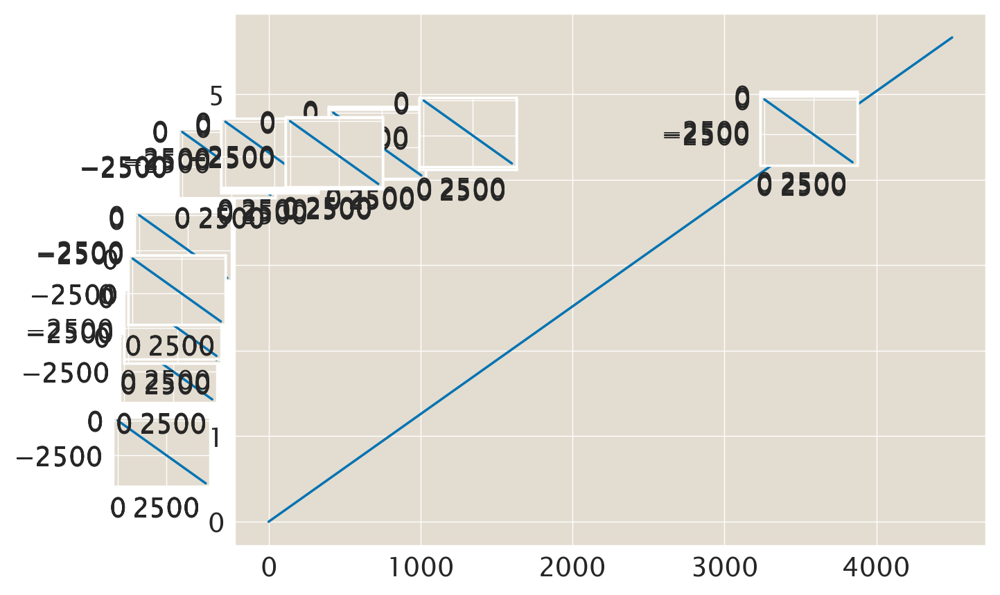

In [159]:
# Different functions in different axis
x= np.arange(0,(1.5*ATPconc.max()),1)
y1 = np.arange(0,(1.5*ratio_mean.max()),(1.5*ratio_mean.max()/len(x)))
y2 = -1*x +3

# plot
ax1 = plt.axes() # standard axes
ax1.plot(x,y1)
for i, ATP in enumerate(ATPconc):
    ax2 = plt.axes([ATP/(1.5*ATPconc.max()), ratio_mean[i]/(1.5*ratio_mean.max()), 0.1, 0.1])
#ax2 = plt.axes([ATP/ATPconc.max(), 0.3, 0.1, 0.1])
    ax2.plot(x,y2)



In [117]:
np.unique(ATPconc)

array([   0,   30,   50,   70,  100,  300,  500,  800, 1000, 1420, 3000])

In [109]:
np.sqrt(np.diag(cov))

array([0.17305494, 0.52428782])

In [110]:
coefficients

array([ 0.22758646, -0.16740587])

In [36]:
bound_mean[test_frame]==np.nanmean(bound_norm[test_frame].flatten())

True

In [37]:
bound_std[test_frame]==np.nanstd(bound_norm[test_frame].flatten())

True

In [24]:
np.nanstd(bound_norm[test_frame].flatten())==np.nanstd(bound_norm[test_frame])

True

## Plot the data and fit to a Hill function

In [50]:
#Langmuir equation
def ATeam_Hill(conc, a, b, c, d):
    """
    Given a concentration value, this function returns an intensity value based on the Hill function given
    in Immamura et. al (ATeam paper)
    Parameters
    conc = 1D array of concentrations
    a, b, c, d parameters of the function
    
    Returns
    A 1D array of intensities corresponding to the given concentrations
    """
    
    
    
    return (((b-c)*(conc/a)**d/(1+(conc/a)**d))+c)



#Curve-fit to the Langmuir curve
def ATeam_Hill_curve_fit(conc, calavg, maxconc, p0):
    """
    Performs a curve fitting using scipy.optimize.curve_fit to fit data to a Langmuir curve
    
    Parameters
    conc = 1D array of concentrations
    calavg = 1D array of average intensity values of data
    maxconc = scalar Maximum concentration of data taken
    p0 = 1D list with 4 entries of parameter guesses for a, b, c, and d in the Hill function
    
    Returns
    param = 1D list with fit values of each parameter
    curve = 1D array of intensity values for every concentration in xvals
    xvals = 1D array from 0 to maxconc with step size 1
    """
    
    
    #Curve fits and returns parameter values as well as the covarience
    param, param_cov = curve_fit(ATeam_Hill, 
                                 conc, 
                                 calavg, 
                                 p0, 
                                 bounds = (np.zeros(4), np.ones([4])*np.inf))

    #stores the new function information according to the coefficients given by curve-fit() function 
    xvals=np.linspace(0,maxconc,maxconc)
    curve = ATeam_Hill(xvals, param[0], param[1], param[2], param[3])
    
    return param, curve, xvals

[66.32800735  3.6287413   1.10698118  1.35172188]


Text(0.5, 1.0, 'Km = 66 µM n = 1.4')

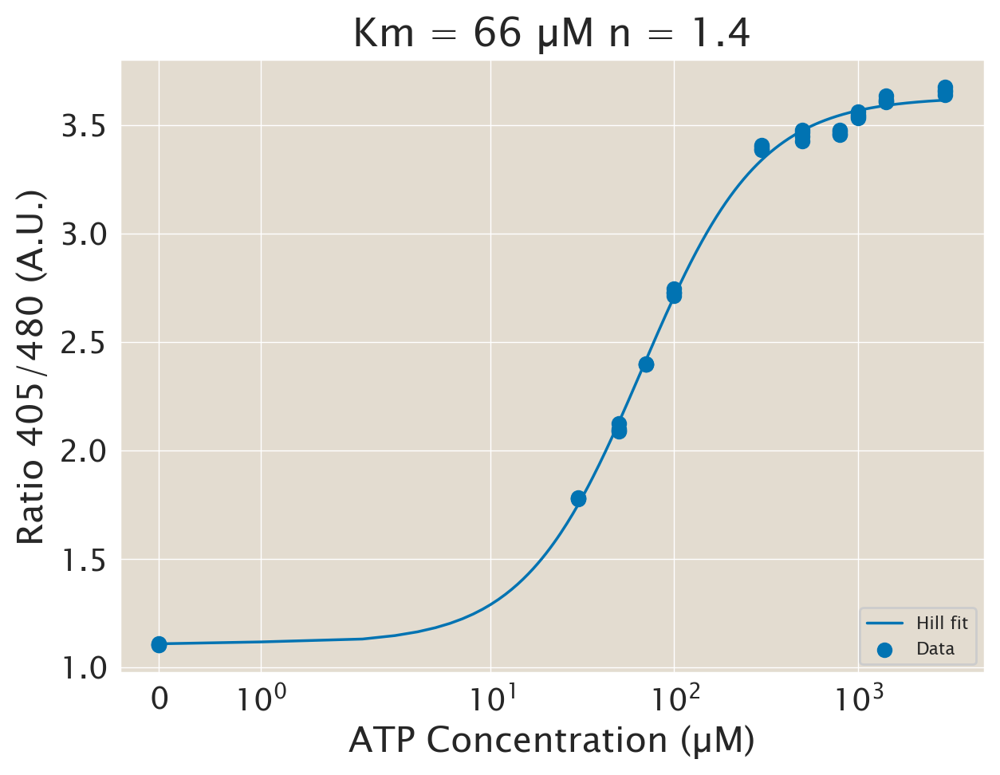

In [71]:
params, curve, xvals = ATeam_Hill_curve_fit(ATPconc, ratio_calavg, np.max(ATPconc), [300, 1, 0.5, 2])
print(params)

plt.scatter(ATPconc, ratio_calavg, label = 'Data')
plt.xscale('symlog')
plt.plot(xvals, curve, label='Hill fit')
plt.legend(loc = 'lower right')
plt.xlabel('ATP Concentration (µM)')
plt.ylabel('Ratio 405/480 (A.U.)')
plt.title('Km = ' +str(round(params[0])) + ' µM'+ ' n = ' + str(round(params[3], 1)))

In [52]:
def ATP_inten_to_conc(array, Km, Rmax, Rmin, nhill):
    return Km * ((Rmin - array) / (array - Rmax)) ** (1/nhill)

In [53]:
def replace_out_of_range_values(arr, min_value, max_value, RinitATP):
    arr_copy = np.copy(arr)
    mask_min = arr < min_value
    mask_max = arr > max_value
    arr_copy[mask_min] = min_value
    arr_copy[mask_max] = RinitATP
    return arr_copy

In [54]:
### Define the ratio data to work with and convert to concentration
#ims_ratio = replace_out_of_range_values(ratios_im[included], Rmin, Rmax, RinitATP)
ims_ratio_conc = []

#convert each image to concentration values
for im in tqdm(ratio_im):
    #set nans to zero
    im_conc = ATP_inten_to_conc(im, params[0],  params[1],   params[2],  params[3])
    ims_ratio_conc.append(im_conc)
#format as a np.array
ims_ratio_conc = np.array(ims_ratio_conc)

  0%|          | 0/44 [00:00<?, ?it/s]

/var/folders/8p/dg75nl0d7ml8f_vqy6lvm3740000gn/T/ipykernel_99989/907947138.py:2: RuntimeWarning: invalid value encountered in power
  return Km * ((Rmin - array) / (array - Rmax)) ** (1/nhill)


In [72]:
np.where(ATPconc<=100)

(array([ 0,  1,  2,  3,  8,  9, 10, 11, 24, 25, 26, 27, 32, 33, 34, 35, 36,
        37, 38, 39]),)

300


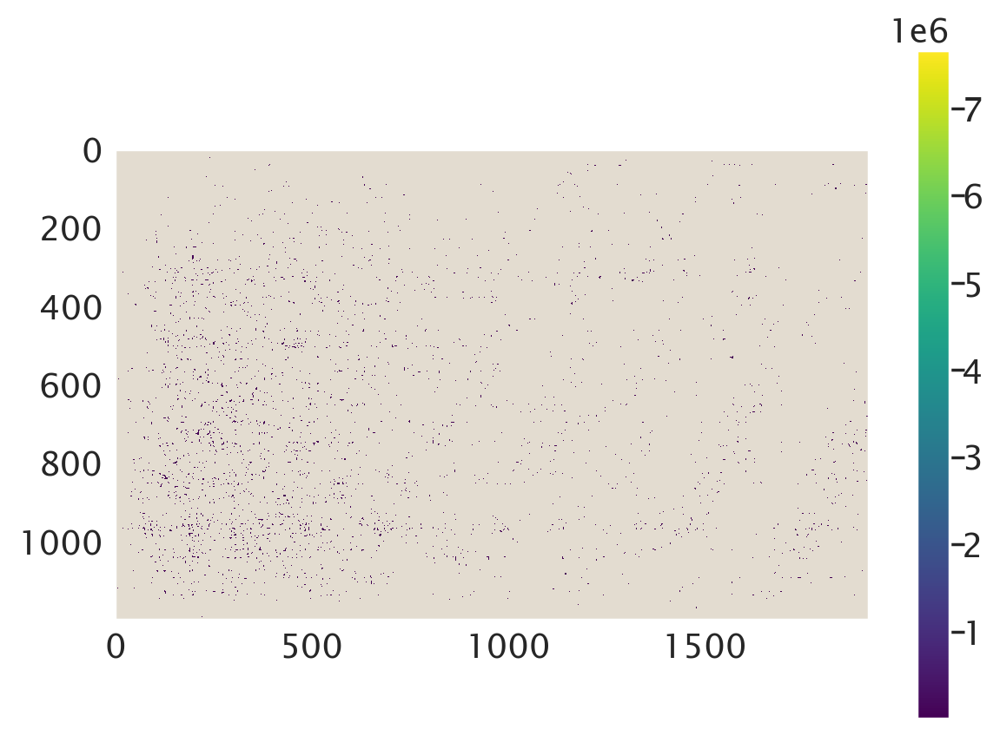

In [87]:
index = 20
print(ATPconc[index])
plt.imshow(ims_ratio_conc[index])
plt.grid(False)
plt.colorbar()

(array([[669.,   0.,   0., ...,   0.,   0.,   0.],
        [770.,   0.,   0., ...,   0.,   0.,   0.],
        [703.,   0.,   0., ...,   0.,   0.,   0.],
        ...,
        [719.,   0.,   0., ...,   0.,   0.,   0.],
        [706.,   0.,   0., ...,   0.,   0.,   0.],
        [659.,   0.,   0., ...,   0.,   0.,   0.]]),
 array([3.66093214e+00, 3.09349316e+06, 6.18698266e+06, 9.28047216e+06,
        1.23739617e+07, 1.54674512e+07, 1.85609407e+07, 2.16544302e+07,
        2.47479196e+07, 2.78414091e+07, 3.09348986e+07]),
 <a list of 1920 BarContainer objects>)

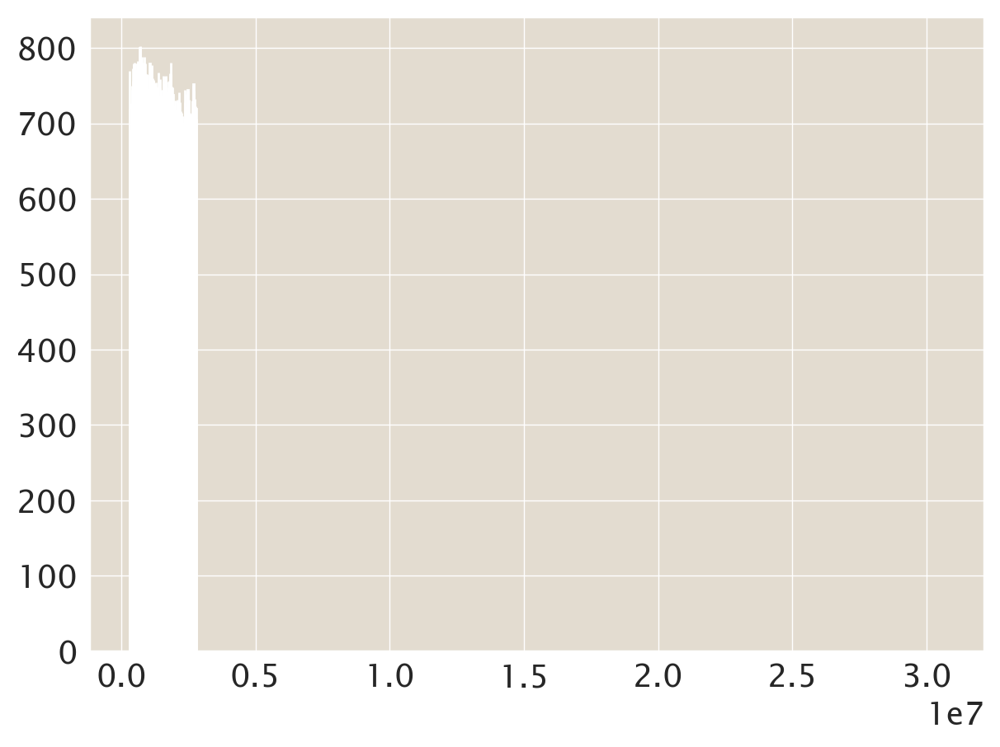

In [65]:
plt.hist(ims_ratio_conc[31])

In [64]:
ATPconc[31]

500

In [70]:
params

array([66.32800735,  3.6287413 ,  1.10698118,  1.35172188])

In [119]:
np.sort(ratio_calavg)

array([1.09966367, 1.10237038, 1.10351479, 1.10691072, 1.77509255,
       1.77764654, 1.7786739 , 1.78140631, 2.08722783, 2.08941708,
       2.09717231, 2.122548  , 2.39485406, 2.3963391 , 2.3972825 ,
       2.39841161, 2.71160353, 2.72593407, 2.72655414, 2.74449895,
       3.38527441, 3.38855134, 3.39839631, 3.40514301, 3.42526776,
       3.44775953, 3.4537885 , 3.4582166 , 3.46569522, 3.47075061,
       3.4772127 , 3.47751057, 3.53076138, 3.54006249, 3.54678936,
       3.56253908, 3.6072004 , 3.60951381, 3.61671257, 3.63479348,
       3.64025581, 3.6534211 , 3.65977052, 3.67360329])